In [37]:
import pandas as pd
import numpy as np 
from matplotlib import pyplot as plt
import seaborn as sns
import os

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


## Data Overview

| Column Name                  | Description                                                                                       |
|------------------------------|---------------------------------------------------------------------------------------------------|
| `Flow ID`                    | Unique identifier for the flow.                                                                   |
| `Source IP`                  | IP address of the source.                                                                         |
| `Source Port`                | Port number of the source.                                                                        |
| `Destination IP`             | IP address of the destination.                                                                    |
| `Destination Port`           | Port number of the destination.                                                                   |
| `Protocol`                   | Network protocol used (e.g., TCP, UDP, ICMP).                                                     |
| `Timestamp`                  | Time at which the packet was captured.                                                            |
| `Flow Duration`              | Duration of the network flow in microseconds.                                                     |
| `Total Fwd Packets`          | Total number of packets in the forward direction (from source to destination).                    |
| `Total Backward Packets`     | Total number of packets in the backward direction (from destination to source).                   |
| `Total Length of Fwd Packets`| Total length of all forward packets in bytes.                                                     |
| `Total Length of Bwd Packets`| Total length of all backward packets in bytes.                                                    |
| `Fwd Packet Length Max`      | Maximum length of a packet in the forward direction.                                              |
| `Fwd Packet Length Min`      | Minimum length of a packet in the forward direction.                                              |
| `Fwd Packet Length Mean`     | Mean length of packets in the forward direction.                                                  |
| `Fwd Packet Length Std`      | Standard deviation of packet length in the forward direction.                                     |
| `Bwd Packet Length Max`      | Maximum length of a packet in the backward direction.                                             |
| `Bwd Packet Length Min`      | Minimum length of a packet in the backward direction.                                             |
| `Bwd Packet Length Mean`     | Mean length of packets in the backward direction.                                                 |
| `Bwd Packet Length Std`      | Standard deviation of packet length in the backward direction.                                    |
| `Flow Bytes/s`               | Number of bytes per second for the flow.                                                          |
| `Flow Packets/s`             | Number of packets per second for the flow.                                                        |
| `Flow IAT Mean`              | Mean inter-arrival time between packets in the flow.                                              |
| `Flow IAT Std`               | Standard deviation of inter-arrival time between packets in the flow.                             |
| `Flow IAT Max`               | Maximum inter-arrival time between packets in the flow.                                           |
| `Flow IAT Min`               | Minimum inter-arrival time between packets in the flow.                                           |
| `Fwd IAT Total`              | Total inter-arrival time for packets in the forward direction.                                    |
| `Fwd IAT Mean`               | Mean inter-arrival time for packets in the forward direction.                                     |
| `Fwd IAT Std`                | Standard deviation of inter-arrival time for packets in the forward direction.                    |
| `Fwd IAT Max`                | Maximum inter-arrival time for packets in the forward direction.                                  |
| `Fwd IAT Min`                | Minimum inter-arrival time for packets in the forward direction.                                  |
| `Bwd IAT Total`              | Total inter-arrival time for packets in the backward direction.                                   |
| `Bwd IAT Mean`               | Mean inter-arrival time for packets in the backward direction.                                    |
| `Bwd IAT Std`                | Standard deviation of inter-arrival time for packets in the backward direction.                   |
| `Bwd IAT Max`                | Maximum inter-arrival time for packets in the backward direction.                                 |
| `Bwd IAT Min`                | Minimum inter-arrival time for packets in the backward direction.                                 |
| `Fwd PSH Flags`              | Number of times the PSH (Push) flag was set in the forward direction.                             |
| `Bwd PSH Flags`              | Number of times the PSH flag was set in the backward direction.                                   |
| `Fwd URG Flags`              | Number of times the URG (Urgent) flag was set in the forward direction.                           |
| `Bwd URG Flags`              | Number of times the URG flag was set in the backward direction.                                   |
| `Fwd Header Length`          | Total length of forward headers in bytes.                                                         |
| `Bwd Header Length`          | Total length of backward headers in bytes.                                                        |
| `Fwd Packets/s`              | Number of forward packets per second.                                                             |
| `Bwd Packets/s`              | Number of backward packets per second.                                                            |
| `Min Packet Length`          | Minimum length of all packets in the flow.                                                        |
| `Max Packet Length`          | Maximum length of all packets in the flow.                                                        |
| `Packet Length Mean`         | Mean length of all packets in the flow.                                                           |
| `Packet Length Std`          | Standard deviation of packet length in the flow.                                                  |
| `Packet Length Variance`     | Variance of packet length in the flow.                                                            |
| `FIN Flag Count`             | Number of times the FIN (Finish) flag was set.                                                    |
| `SYN Flag Count`             | Number of times the SYN (Synchronize) flag was set.                                               |
| `RST Flag Count`             | Number of times the RST (Reset) flag was set.                                                     |
| `PSH Flag Count`             | Number of times the PSH flag was set.                                                             |
| `ACK Flag Count`             | Number of times the ACK (Acknowledgment) flag was set.                                            |
| `URG Flag Count`             | Number of times the URG flag was set.                                                             |
| `CWE Flag Count`             | Count of CWE (Congestion Window Reduced) flags.                                                   |
| `ECE Flag Count`             | Count of ECE (Explicit Congestion Notification Echo) flags.                                       |
| `Down/Up Ratio`              | Ratio of download to upload packets.                                                              |
| `Average Packet Size`        | Average packet size across both forward and backward directions.                                  |
| `Avg Fwd Segment Size`       | Average segment size in the forward direction.                                                    |
| `Avg Bwd Segment Size`       | Average segment size in the backward direction.                                                   |
| `Fwd Header Length.1`        | Duplicate of `Fwd Header Length`, may be used for different analysis.                             |
| `Fwd Avg Bytes/Bulk`         | Average number of bytes in each forward bulk.                                                     |
| `Fwd Avg Packets/Bulk`       | Average number of packets in each forward bulk.                                                   |
| `Fwd Avg Bulk Rate`          | Average rate of data transmission in forward bulk.                                                |
| `Bwd Avg Bytes/Bulk`         | Average number of bytes in each backward bulk.                                                    |
| `Bwd Avg Packets/Bulk`       | Average number of packets in each backward bulk.                                                  |
| `Bwd Avg Bulk Rate`          | Average rate of data transmission in backward bulk.                                               |
| `Subflow Fwd Packets`        | Number of packets in the forward subflow.                                                         |
| `Subflow Fwd Bytes`          | Number of bytes in the forward subflow.                                                           |
| `Subflow Bwd Packets`        | Number of packets in the backward subflow.                                                        |
| `Subflow Bwd Bytes`          | Number of bytes in the backward subflow.                                                          |
| `Init_Win_bytes_forward`     | Initial window size in bytes in the forward direction.                                            |
| `Init_Win_bytes_backward`    | Initial window size in bytes in the backward direction.                                           |
| `act_data_pkt_fwd`           | Number of forward direction data packets.                                                         |
| `min_seg_size_forward`       | Minimum segment size in the forward direction.                                                    |
| `Active Mean`                | Mean time the connection was active before going idle.                                            |
| `Active Std`                 | Standard deviation of the time the connection was active before going idle.                       |
| `Active Max`                 | Maximum time the connection was active before going idle.                                         |
| `Active Min`                 | Minimum time the connection was active before going idle.                                         |
| `Idle Mean`                  | Mean time the connection was idle before becoming active.                                         |
| `Idle Std`                   | Standard deviation of the time the connection was idle before becoming active.                    |
| `Idle Max`                   | Maximum time the connection was idle before becoming active.                                      |
| `Idle Min`                   | Minimum time the connection was idle before becoming active.                                      |
| `Label`                      | Label assigned to the traffic flow, indicating whether it is normal or an attack (e.g., DoS).     |


In [3]:
DIR_PATH = os.path.join('..', 'data', 'raw')

mldf = pd.read_csv(os.path.join(DIR_PATH, "MachineLearningCVE.csv"))

In [4]:
mldf.head()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3000000.0,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.0,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,12000000.0,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.0,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,12000000.0,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.0,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,12000000.0,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.0,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4000000.0,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.0,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [5]:
mldf.shape

(2830743, 79)

In [6]:
mldf.describe().T

,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [7]:
mldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2830743 entries, 0 to 2830742
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  

## Data Cleaning

In [8]:
print("duplicated count = ", len(mldf[mldf.duplicated()]))

duplicated count =  308381


In [9]:
# Dropping duplicates 
mldf.drop_duplicates(inplace = True)
mldf.shape

(2522362, 79)

In [10]:
# checking for messing values 
mldf.isna().sum()[mldf.isna().sum() > 0]

Flow Bytes/s    353
dtype: int64

In [11]:
# Checking for infinity values
numeric_cols = mldf.select_dtypes(include = np.number).columns
inf_count = np.isinf(mldf[numeric_cols]).sum()
print(inf_count[inf_count > 0])
     

Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [12]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {mldf.isna().sum().sum()}')

mldf.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {mldf.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [13]:
mldf.isna().sum()[mldf.isna().sum() > 0]

Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64

In [14]:
# Calculating missing value percentage in the dataset
mis_per = (mldf.isna().sum() / len(mldf)) * 100
mis_table = pd.concat([mldf.isna().sum(), mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


#### Dealing with missing values 

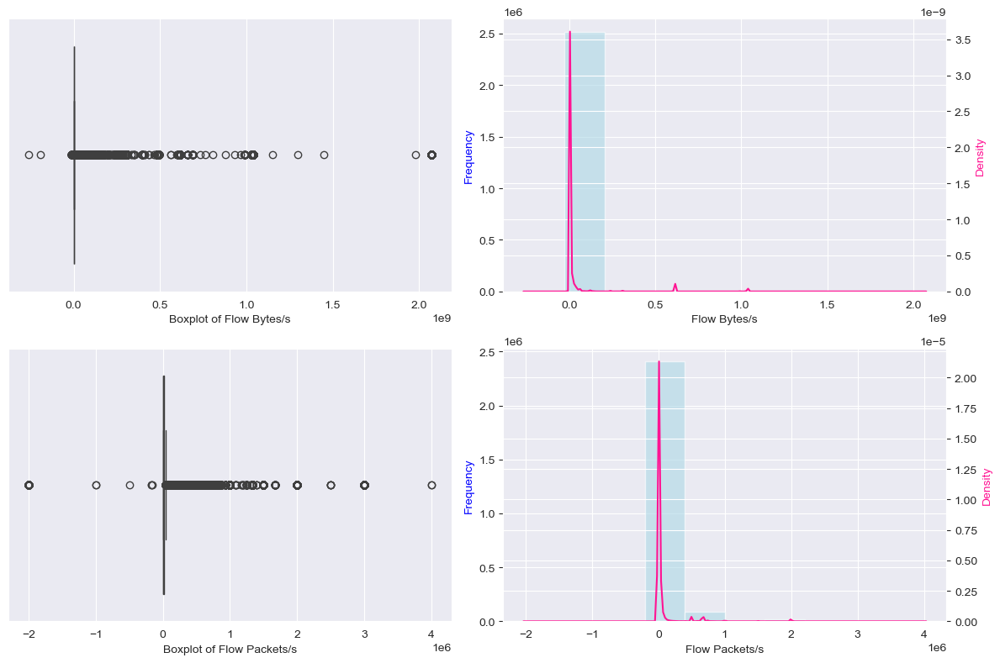

In [15]:
# Create a 2x2 subplot layout
plt.figure(figsize=(12, 8))

# First plot (Boxplot of Flow Bytes/s)
plt.subplot(2, 2, 1)
sns.boxplot(x=mldf['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')

# Second plot (Histogram and KDE for Flow Bytes/s)
plt.subplot(2, 2, 2)
ax1 = plt.gca()
ax1.hist(mldf['Flow Bytes/s'], color='lightblue', alpha=0.6)
ax1.set_xlabel('Flow Bytes/s')
ax1.set_ylabel('Frequency', color='blue')

ax2 = ax1.twinx()
sns.kdeplot(mldf['Flow Bytes/s'], color='deeppink', ax=ax2)
ax2.set_ylabel('Density', color='deeppink')

# Third plot (Boxplot of Flow Packets/s)
plt.subplot(2, 2, 3)
sns.boxplot(x=mldf['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Packets/s')

# Fourth plot (Histogram and KDE for Flow Packets/s)
plt.subplot(2, 2, 4)
ax3 = plt.gca()
ax3.hist(mldf['Flow Packets/s'], color='lightblue', alpha=0.6)
ax3.set_xlabel('Flow Packets/s')
ax3.set_ylabel('Frequency', color='blue')

ax4 = ax3.twinx()
sns.kdeplot(mldf['Flow Packets/s'], color='deeppink', ax=ax4)
ax4.set_ylabel('Density', color='deeppink')

plt.tight_layout()
plt.show()


Flow Bytes/s and Flow Packets/s are continuous variables. We can see from the **Flow Bytes/s** and **Flow Packets/s** histogram and box plot that the majority of values are towards one area which indicates that the data is not normally distributed. The box plot of the **Flow Bytes/s** and **Flow Packets/s** shows that the variables have extreme values or outliers. So, our strategy is to fill in missing values with **median value.**

In [16]:
med_flow_bytes = mldf['Flow Bytes/s'].median()
med_flow_packets = mldf['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

# Filling missing values with median
mldf['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
mldf['Flow Packets/s'].fillna(med_flow_packets, inplace = True)

print('Number of \'Flow Bytes/s\' missing values:', mldf['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', mldf['Flow Packets/s'].isna().sum())

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285
Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


C:\Users\Dyari Elkamel\AppData\Local\Temp\ipykernel_18176\2721066308.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  mldf['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
C:\Users\Dyari Elkamel\AppData\Local\Temp\ipykernel_18176\2721066308.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always 

## Exploratory Data Analysis 

### Visualization of column relationships (Categorical Variables)

In [17]:
mldf.Label.unique()

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack-Brute Force', 'Web Attack-XSS',
       'Web Attack-Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [18]:
mldf.Label.value_counts() *100 / mldf.shape[0]

Label
BENIGN                      83.115905
DoS Hulk                     6.852664
DDoS                         5.075243
PortScan                     3.600554
DoS GoldenEye                0.407792
FTP-Patator                  0.235216
DoS slowloris                0.213490
DoS Slowhttptest             0.207266
SSH-Patator                  0.127618
Bot                          0.077427
Web Attack-Brute Force       0.058279
Web Attack-XSS               0.025849
Infiltration                 0.001427
Web Attack-Sql Injection     0.000833
Heartbleed                   0.000436
Name: count, dtype: float64

In [19]:
c =["BENIGN", "DoS Hulk", "PortScan", "DDoS", "DoS GoldenEye", "FTP-Patator", 
 "SSH-Patator", "DoS slowloris", "DoS Slowhttptest", "Bot", "Web Attack-Brute Force", 
 "Web Attack-XSS", "Infiltration", "Web Attack-Sql", "Heartbleed"]

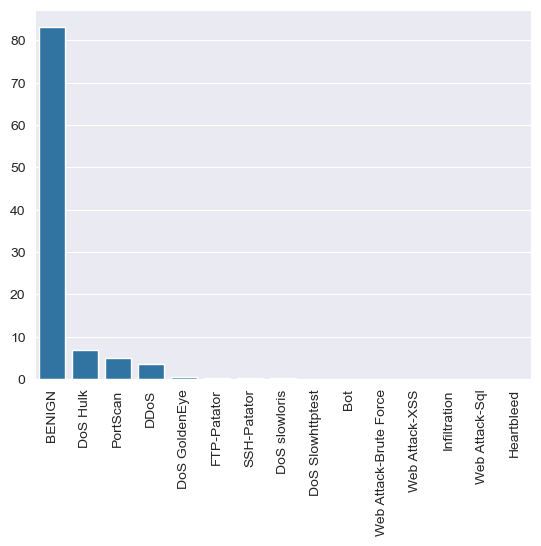

In [20]:
sns.barplot(x = c, y = mldf.Label.value_counts().values* 100 / mldf.shape[0])
plt.xticks(rotation = 90)
plt.show()

In [21]:
# # Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack-Brute Force': 'Web Attack',
    'Web Attack-XSS': 'Web Attack',
    'Web Attack-Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
mldf['Attack Type'] = mldf['Label'].map(attack_map)

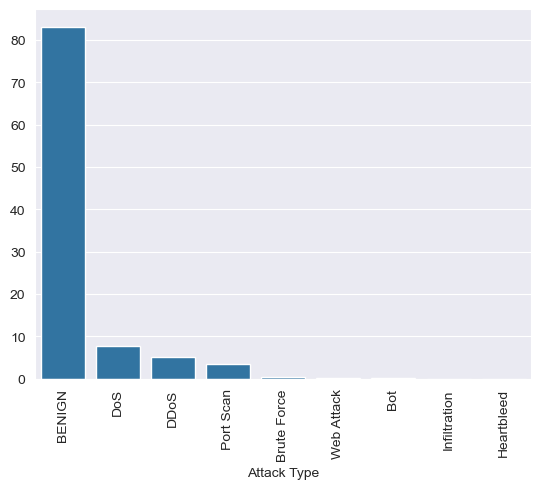

In [22]:
sns.barplot(x =mldf['Attack Type'].value_counts().index , y = mldf['Attack Type'].value_counts().values* 100 / mldf.shape[0])
plt.xticks(rotation = 90)
plt.show()

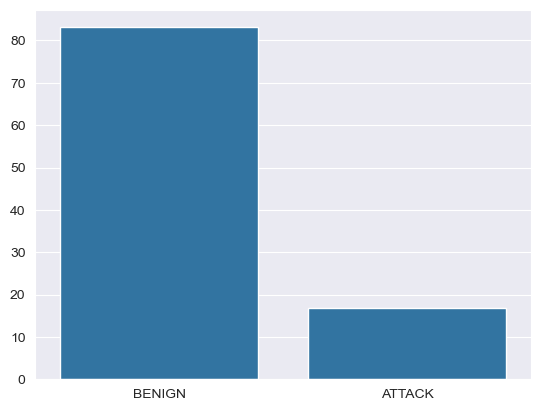

In [23]:
sns.barplot(x = ["BENIGN", "ATTACK"], y = [mldf.Label.value_counts().values[0]* 100 / mldf.shape[0],
                                          sum(mldf.Label.value_counts().values[1:])* 100 / mldf.shape[0]])
plt.show()

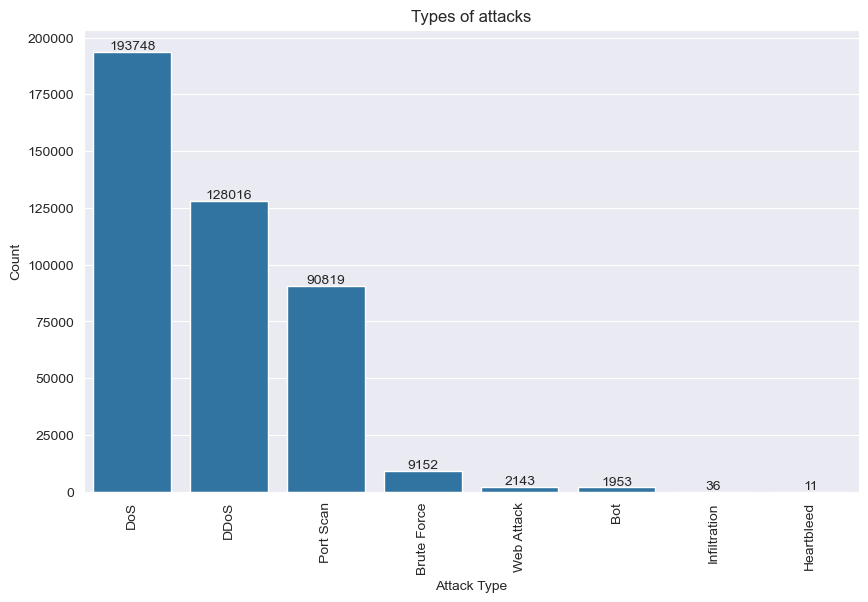

In [24]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = mldf.loc[mldf['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

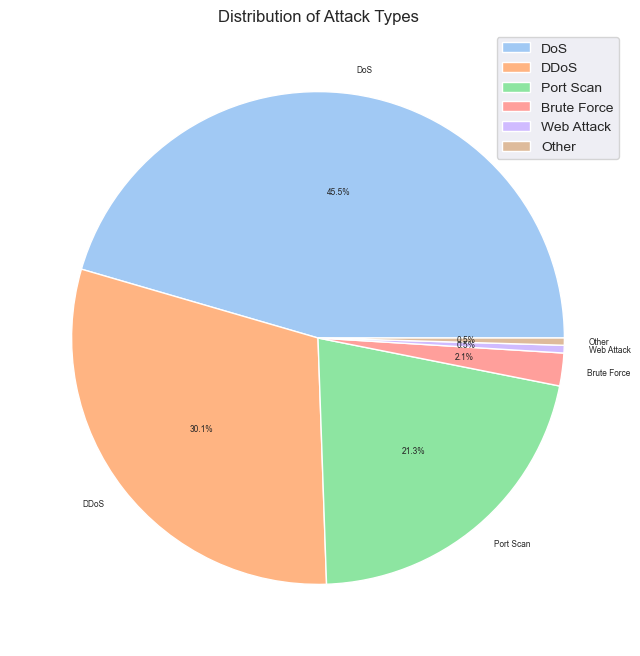

In [25]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()
     

In [26]:
mldf.drop('Label', axis = 1, inplace = True)


In [27]:

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
mldf['Attack Number'] = le.fit_transform(mldf['Attack Type'])

print(mldf['Attack Number'].unique())

[0 2 4 5 8 6 1 7 3]


In [28]:
# Printing corresponding attack type for each encoded value
encoded_values = mldf['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


| Code                        | Attack Type   |
|-----------------------------|---------------|
| 0                           | BENIGN        |
| 1                           | Bot           |
| 2                           | Brute Force   |
| 3                           | DDoS          |
| 4                           | DoS           |
| 5                           | Heartbleed    |
| 6                           | Infiltration  |
| 7                           | Port Scan     |
| 8                           | Web Attack    |


In [29]:
corr = mldf.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

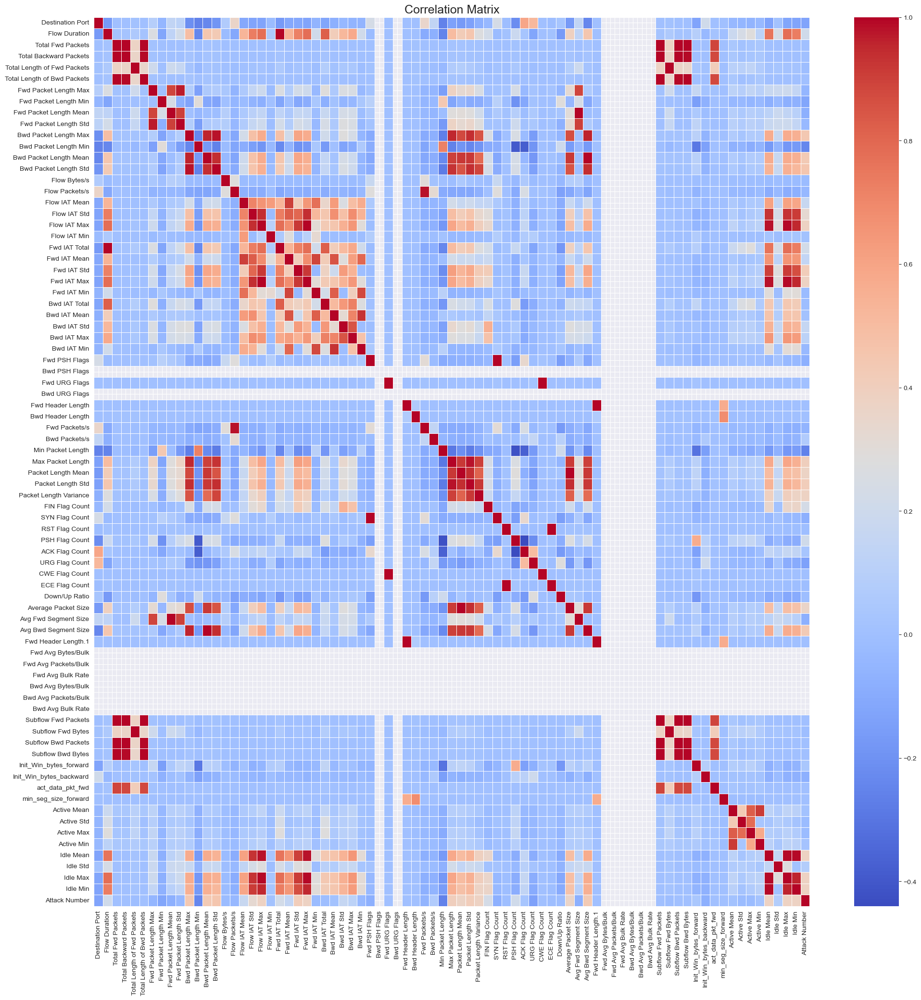

In [30]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [31]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [32]:
print(f'Number of considerably correlated features to the Target : {len(pos_corr_features)}')

Number of considerably correlated features to the Target : 32


In [33]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = mldf.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

 I mapped each label to the corresponding attack type to reduce the number of classes 

The columns with zero standard deviation have the same value in all rows. These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns which results in NaN correlation cofficient. These columns cannot help differentiate between the classes or groups of data. So, these zero standard deviation columns don't contribute to the correlation matrix and will appear blank in the heatmap. This can be helpful while doing data processing as we may drop the columns if we find out that these columns has no variation.

### Visualization of Linear Relationships of columns

In [35]:
# Data sampling for data analysis
sample_size = int(0.04 * len(mldf)) # 20% of the original size
sampled_data = mldf.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(100894, 80)

In [38]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = mldf.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = mldf[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                8704.762165           8682.852291           0.25%
Flow Duration                   16581323.773163       16558990.308046       0.13%
Total Fwd Packets               10.276271             10.801832             5.11%
Total Backward Packets          11.565964             12.437449             7.53%
Total Length of Fwd Packets     611.575108            617.883333            1.03%
Total Length of Bwd Packets     18133.153930          19480.955468          7.43%
Fwd Packet Length Max           231.091768            233.715573            1.14%
Fwd Packet Length Min           19.194641             19.008891             0.97%
Fwd Packet Length Mean          63.470104             64.027653             0.88%
Fwd Packet Length Std    

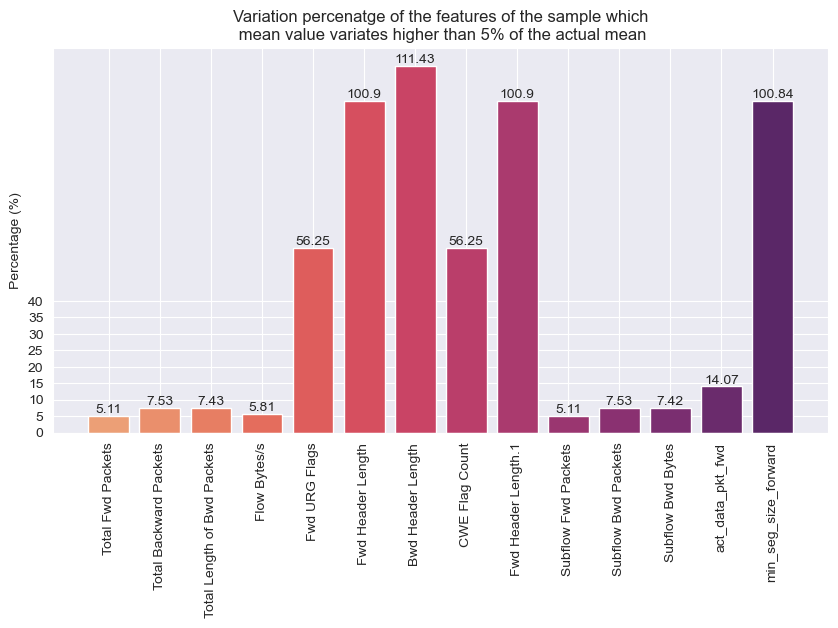

In [39]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette("flare", n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [40]:
# Printing the unique value count
indent = '{:<3} {:<30}| {:<10}| {:<10}|'
print('Unique value count for:           | sampled   | full data |')

for i, feature in enumerate(list(mldf.columns)[:-1], start=1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique(), mldf[feature].nunique()))


Unique value count for:           | sampled   | full data |
1.  Destination Port              | 13723     | 53805     |
2.  Flow Duration                 | 60300     | 1050899   |
3.  Total Fwd Packets             | 314       | 1432      |
4.  Total Backward Packets        | 389       | 1747      |
5.  Total Length of Fwd Packets   | 4530      | 17928     |
6.  Total Length of Bwd Packets   | 8979      | 64698     |
7.  Fwd Packet Length Max         | 2258      | 5279      |
8.  Fwd Packet Length Min         | 159       | 384       |
9.  Fwd Packet Length Mean        | 11464     | 99716     |
10. Fwd Packet Length Std         | 17445     | 253909    |
11. Bwd Packet Length Max         | 2504      | 4838      |
12. Bwd Packet Length Min         | 362       | 583       |
13. Bwd Packet Length Mean        | 12895     | 147614    |
14. Bwd Packet Length Std         | 15312     | 248869    |
15. Flow Bytes/s                  | 74576     | 1593908   |
16. Flow Packets/s                | 6577

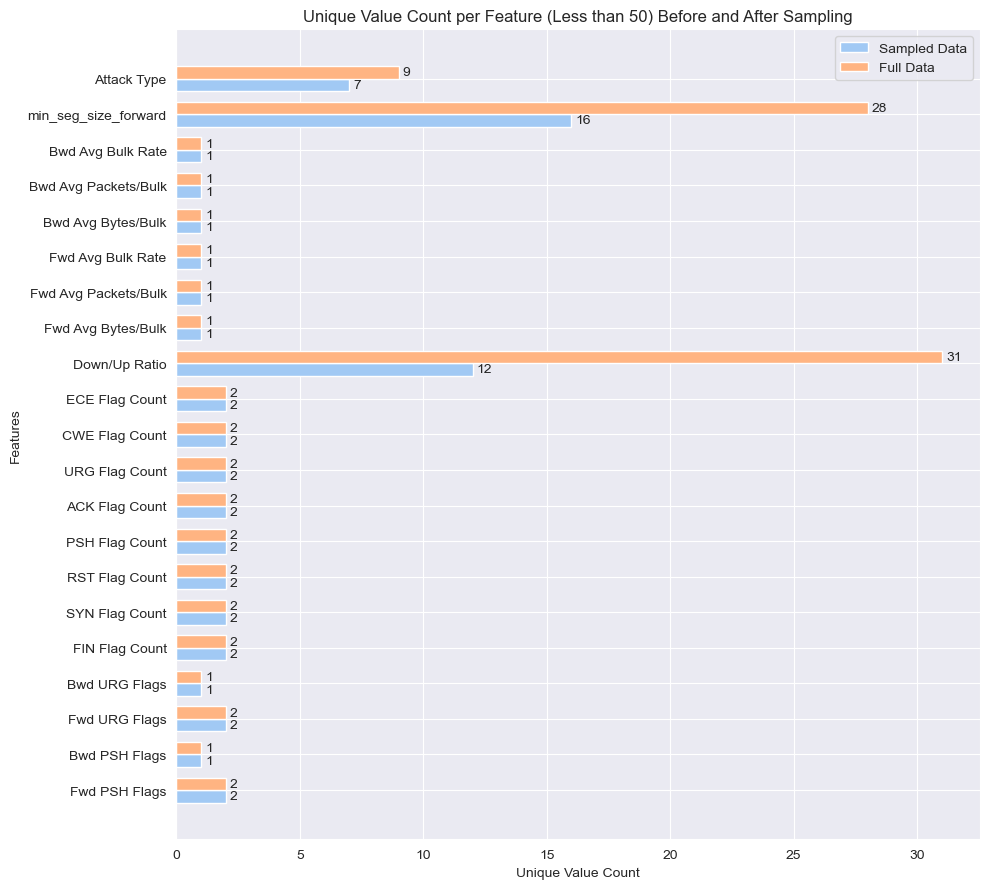

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Get the feature names and unique value counts for both datasets
features = list(mldf.columns)[:-1]
sampled_unique_counts = [sampled_data[feature].nunique() for feature in features]
full_data_unique_counts = [mldf[feature].nunique() for feature in features]

# Filter for features with less than 50 unique values
filtered_features = [
    feature for i, feature in enumerate(features)
    if sampled_unique_counts[i] < 50 and full_data_unique_counts[i] < 50
]
filtered_sampled_counts = [
    sampled_unique_counts[i] for i in range(len(features)) 
    if sampled_unique_counts[i] < 50 and full_data_unique_counts[i] < 50
]
filtered_full_counts = [
    full_data_unique_counts[i] for i in range(len(features))
    if sampled_unique_counts[i] < 50 and full_data_unique_counts[i] < 50
]

# Set the positions and width for the bars
y = np.arange(len(filtered_features))  # label locations
width = 0.35  # width of the bars

# Create the plot
fig, ax = plt.subplots(figsize=(10, 9))

# Add horizontal bars for the sampled and full data counts
rects1 = ax.barh(y - width/2, filtered_sampled_counts, height=width, label='Sampled Data')
rects2 = ax.barh(y + width/2, filtered_full_counts, height=width, label='Full Data')

# Add labels, title, and custom y-axis tick labels
ax.set_ylabel('Features')
ax.set_xlabel('Unique Value Count')
ax.set_title('Unique Value Count per Feature (Less than 50) Before and After Sampling')
ax.set_yticks(y)
ax.set_yticklabels(filtered_features)
ax.legend()

# Add a function to label the bars with their counts
def autolabel(rects):
    """Attach a text label next to each bar, displaying its width (count)."""
    for rect in rects:
        width = rect.get_width()
        ax.annotate(f'{width}',
                    xy=(width, rect.get_y() + rect.get_height() / 2),
                    xytext=(3, 0),  # Offset the text to the right of the bar
                    textcoords="offset points",
                    ha='left', va='center')

# Apply the autolabel function to both bar sets
autolabel(rects1)
autolabel(rects2)

# Adjust layout to make room for the y-axis labels
fig.tight_layout()

# Show the plot
plt.show()


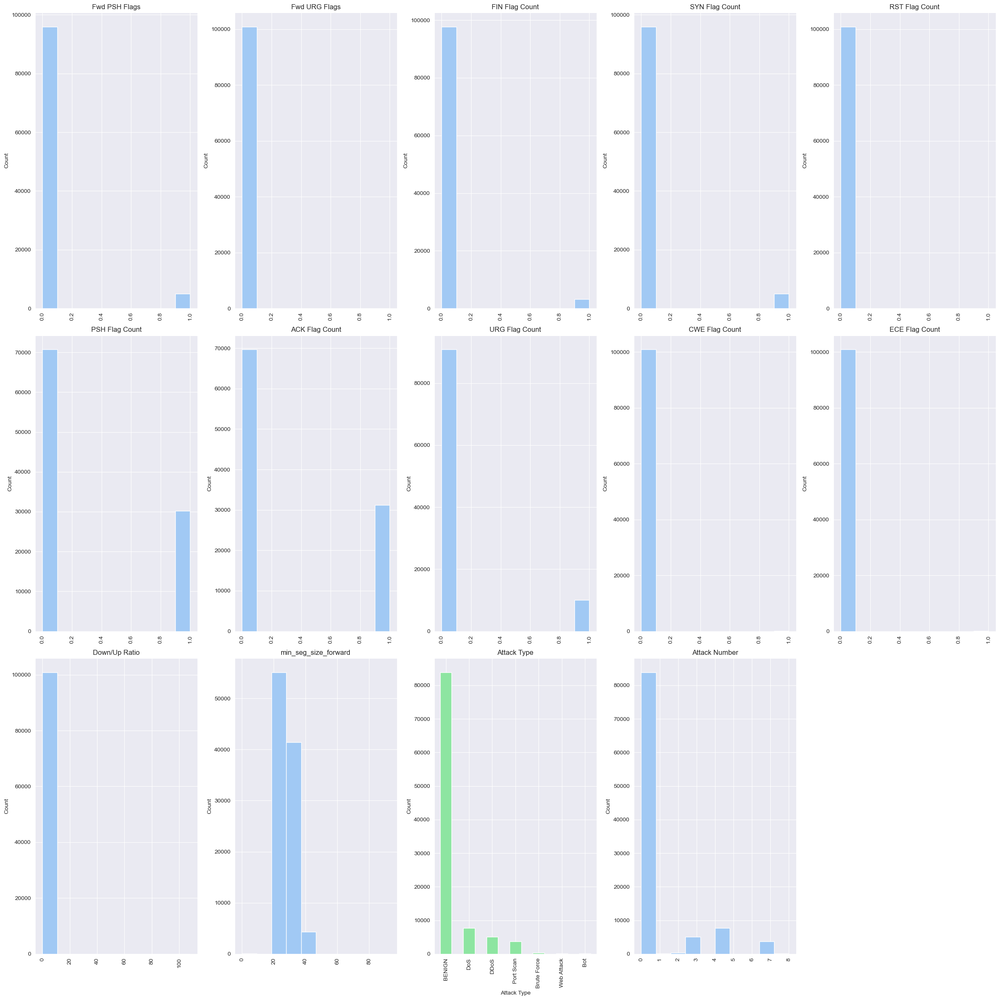

In [42]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 5

color_palette = sns.color_palette(n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 5, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

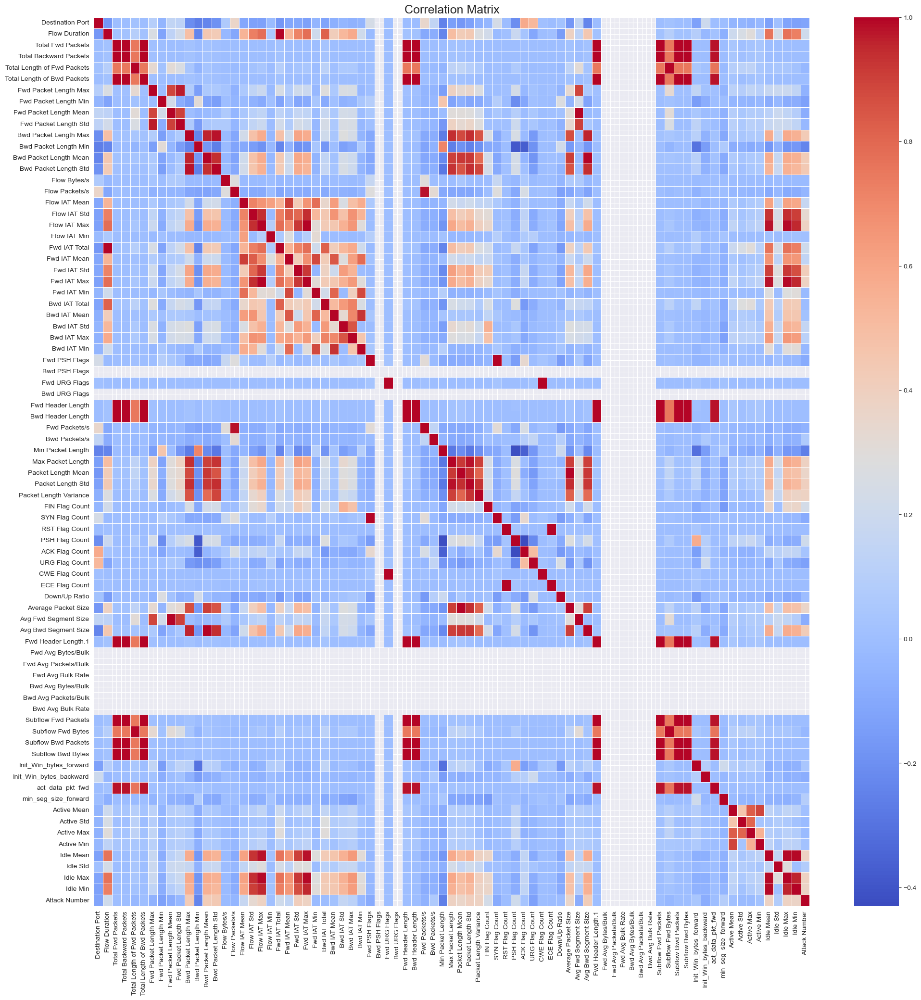

In [43]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr_matrix, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

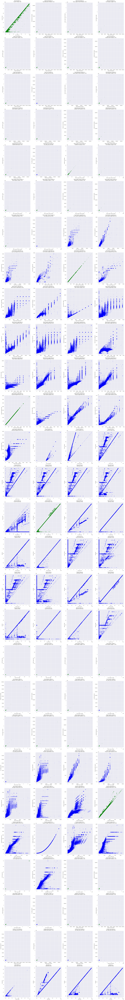

In [44]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
    for j in range(i + 1, len(cols)):
        val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
        # If the correlation coefficient is NaN or below the threshold, skip to the next pair
        if np.isnan(val) or val < corr_th:
            continue
        high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
    rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
        try:
            val, x, y = high_corr_pairs[i * cols + j]
            if val > 0.99:
                axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
            else:
                axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
            axs[i, j].set_xlabel(x)
            axs[i, j].set_ylabel(y)
            axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
        except IndexError:
            fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [45]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
mldf.drop('Attack Number', axis = 1, inplace = True)

In [46]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

outlier_stats

,Outlier Count,Outlier Percentage
Destination Port,21857,21.66
Flow Duration,18689,18.52
Total Fwd Packets,10271,10.18
Total Backward Packets,9663,9.58
Total Length of Fwd Packets,12689,12.58
Total Length of Bwd Packets,23010,22.81
Fwd Packet Length Max,9957,9.87
Fwd Packet Length Min,516,0.51
Fwd Packet Length Mean,7188,7.12
Fwd Packet Length Std,9490,9.41


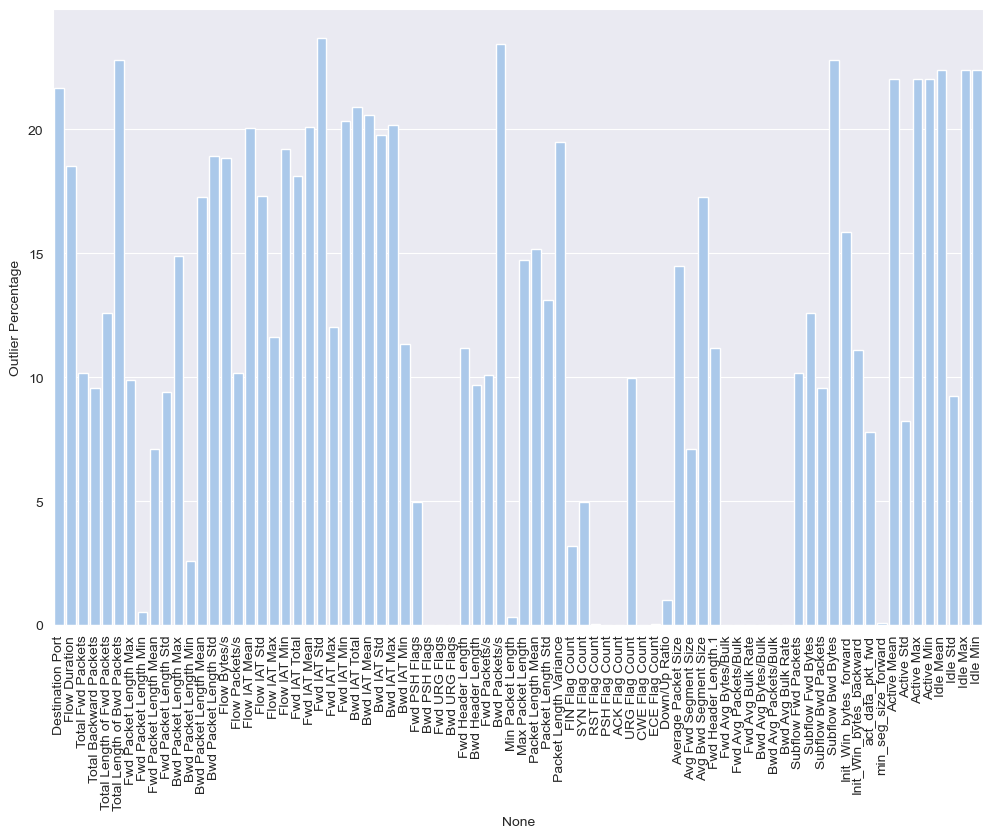

In [47]:
plt.figure(figsize=(12,8))
ax = sns.barplot(data = outlier_stats, y = outlier_stats['Outlier Percentage'] ,  x = outlier_stats.index )
plt.xticks(rotation = 90)
plt.show()

In [48]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)



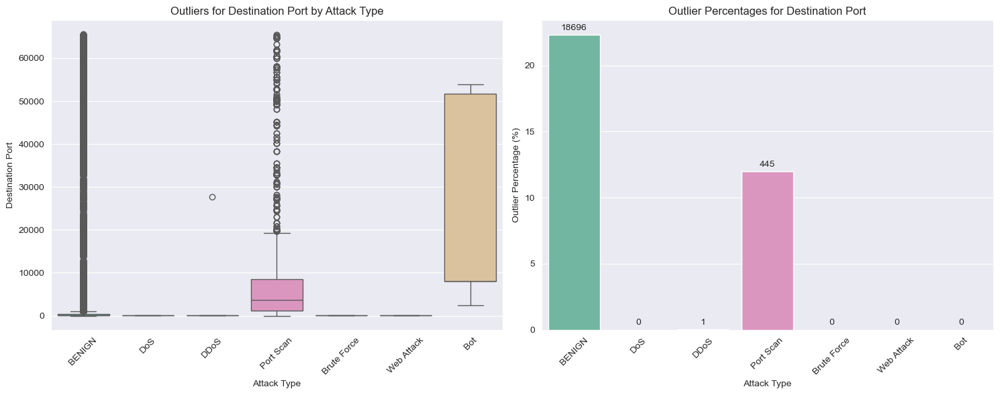

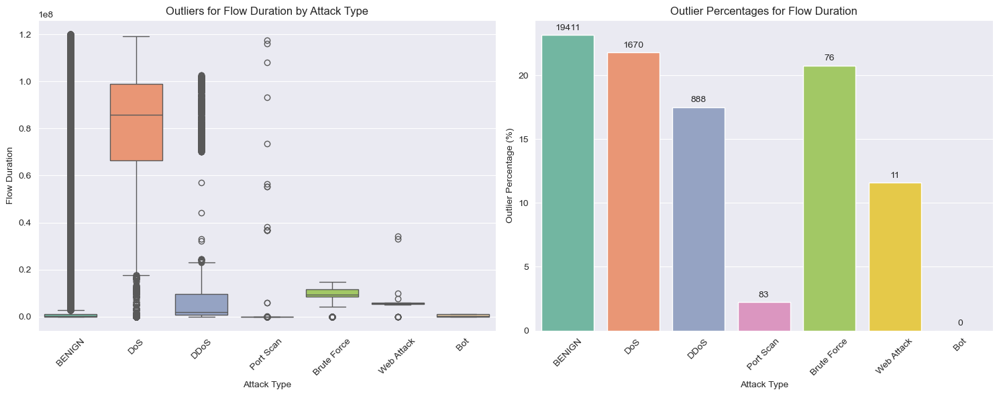

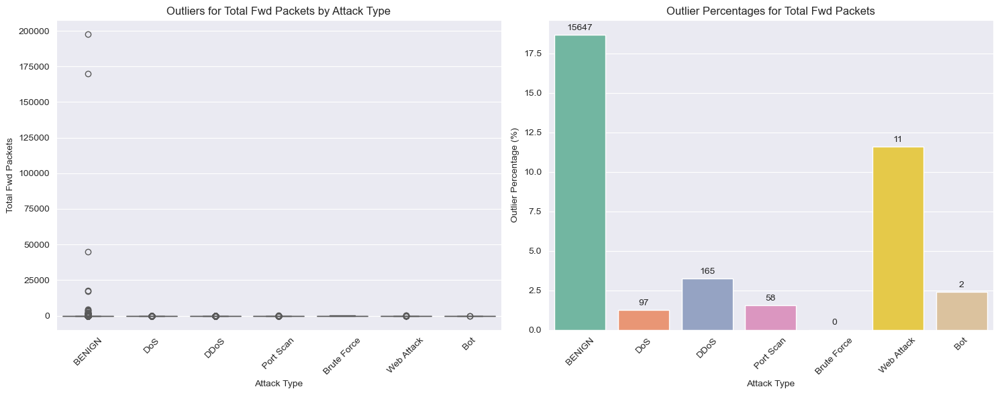

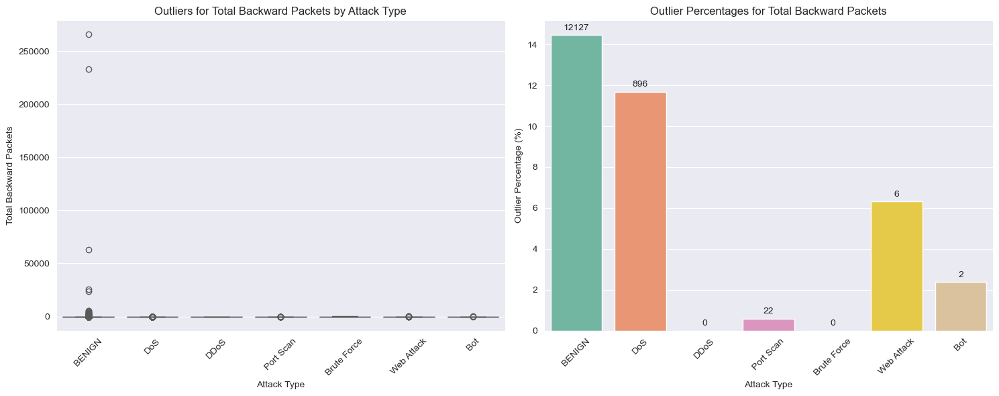

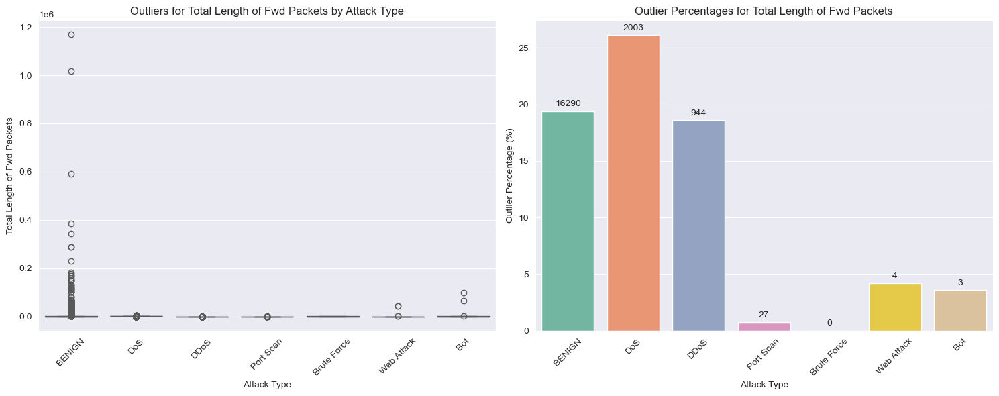

...

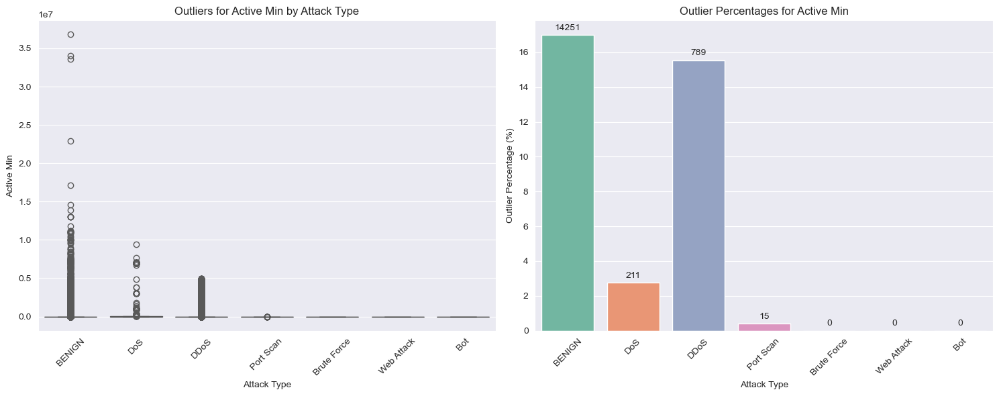

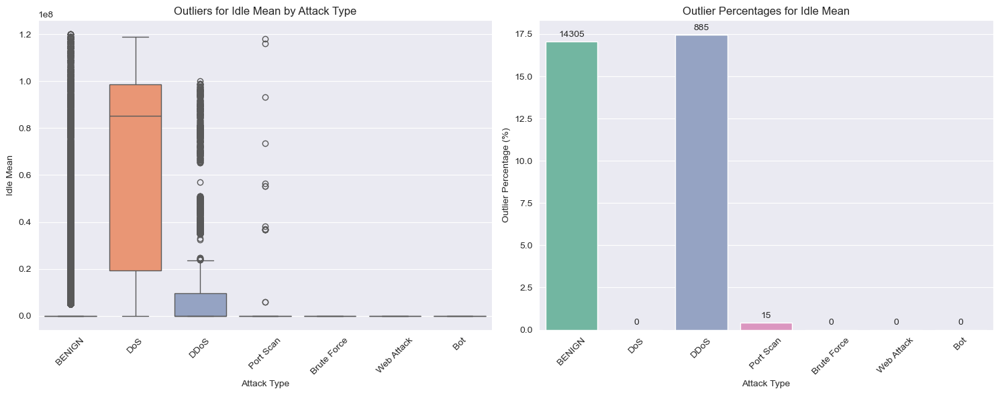

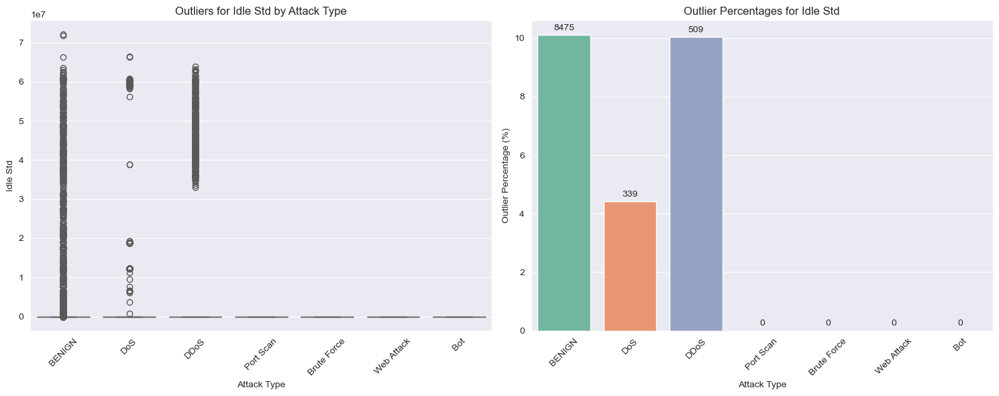

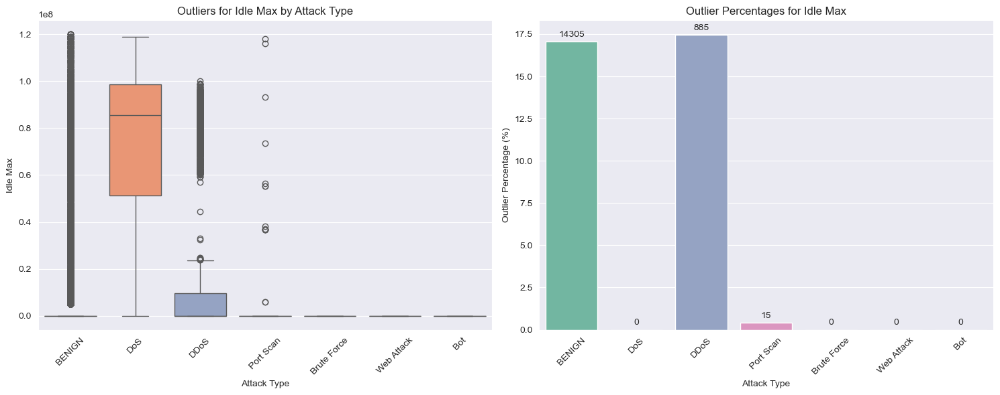

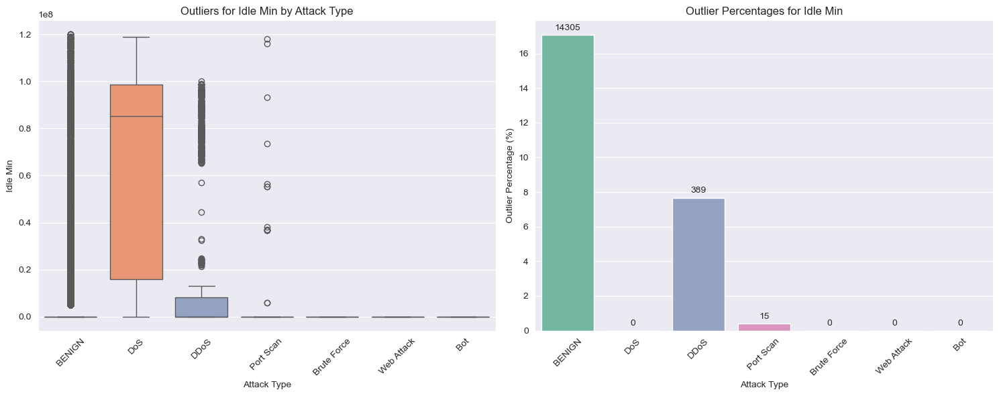

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creating subplots for boxplot and percentage of outliers per class
outlier_counts = {}

for feature in numeric_data:
    outlier_counts[feature] = {}
    
    # Calculate outliers for each class
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[feature][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[feature][attack_type] = (num_outliers, outlier_percent)

    # Plotting
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Boxplot on the left
    sns.boxplot(x='Attack Type', y=feature, data=sampled_data, palette="Set2", ax=axes[0])
    axes[0].set_title(f'Outliers for {feature} by Attack Type')
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
    axes[0].set_ylabel(f'{feature}')
    axes[0].set_xlabel('Attack Type')

    # Barplot of outlier percentages on the right
    attack_types = list(outlier_counts[feature].keys())
    outlier_percents = [outlier_counts[feature][atk][1] for atk in attack_types]
    outlier_numbers = [outlier_counts[feature][atk][0] for atk in attack_types]
    
    rects = sns.barplot(x=attack_types, y=outlier_percents, palette="Set2", ax=axes[1])
    axes[1].set_title(f'Outlier Percentages for {feature}')
    axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)
    axes[1].set_ylabel('Outlier Percentage (%)')
    axes[1].set_xlabel('Attack Type')
    
    # Function to label the bars with the outlier count
    def autolabel(rects, numbers):
        """Attach a text label above each bar displaying its count."""
        for rect, num in zip(rects.patches, numbers):
            height = rect.get_height()
            axes[1].annotate(f'{num}',
                             xy=(rect.get_x() + rect.get_width() / 2, height),
                             xytext=(0, 3),  # 3 points vertical offset
                             textcoords="offset points",
                             ha='center', va='bottom')
    
    # Apply the autolabel function to add counts to the bars
    autolabel(rects, outlier_numbers)
    
    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()


In [50]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)



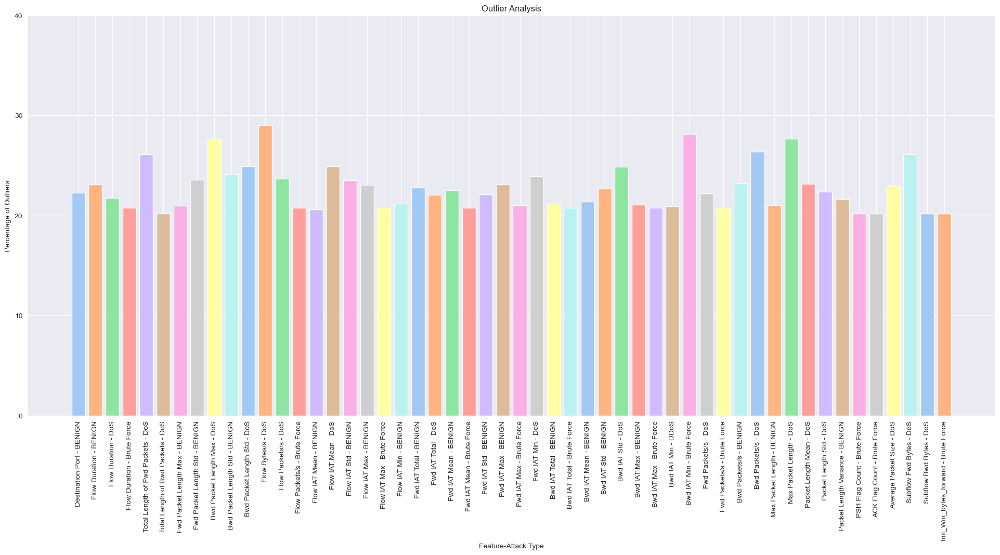

In [51]:
# Plotting the features with outlier percentage higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

I sampled 20% of the dataset to do our computationally expensive analysis. We also assessed whether the sample is representative of the population by doing a comparison of descriptive statistics (mean) and features that variates 5% higher than the actual mean values of the dataset.

A histogram for numerical columns and a bar plot for categorical columns are generated that have more than one unique value and less than 50 unique values. The plots visualize the distribution of data in a quick and easier way. This visualizes patterns like the distribution of values in numerical columns and common categories in categorical columns. It is used to understand the relationships between different variables and identify anomalies in the data.

The scatter plots show the relationship between strongly positive correlated features with a correlation coefficient of 0.85 or higher. Blue scatter plot points show the correlation coefficient pairs less than 0.99 and green scatter plot points show the pairs with 0.99 or almost 1.0. From these plots, we can visualize linear relationships between the features or identify indications of multicollinearity between features where two or more predictors are highly correlated. Highly correlated features introduce multicollinearity which causes problems for machine learning algorithms because it assumes that the features are independent. From some of the plots, we can see that there is a tight cluster of data points around the straight line where the correlation coefficient is close to 1.

We identified the outliers of each feature based on attack types and found that this dataset contains many outliers. Outliers increase variability in the dataset. But in the dataset, outliers may indicate different patterns like network intrusion attempts.

### Visualization of column relationships (Categorical Variables)

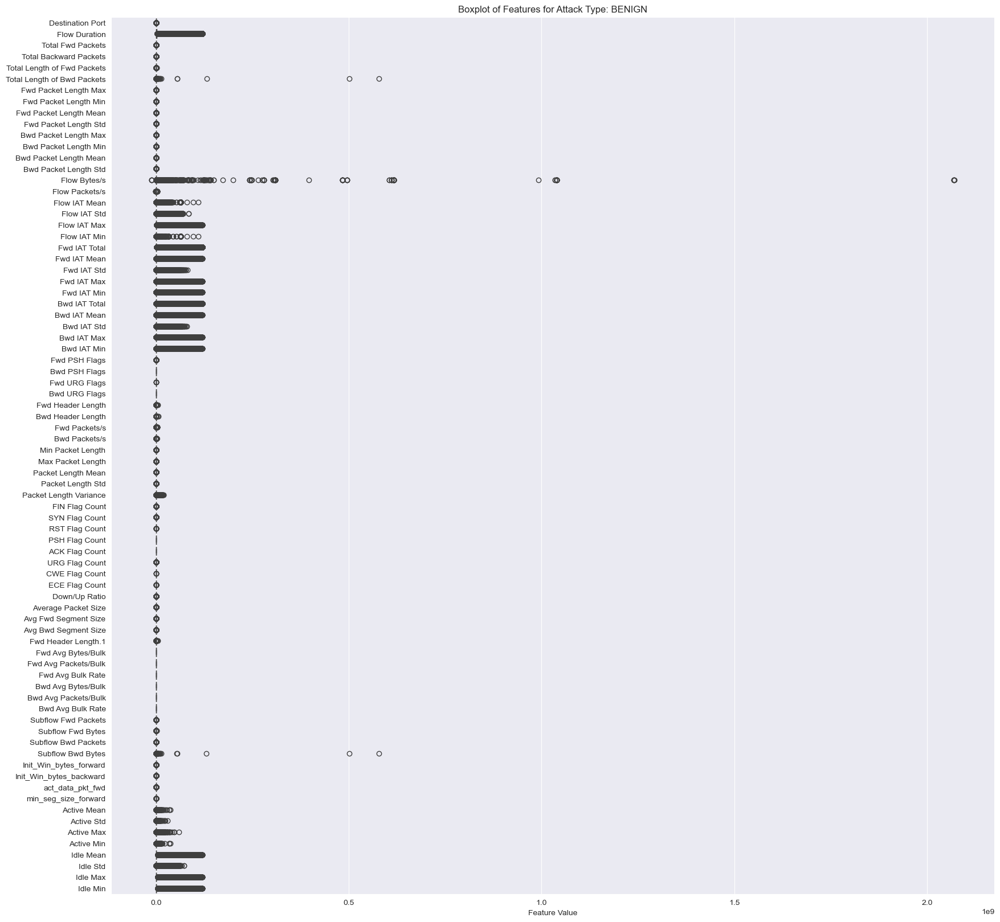

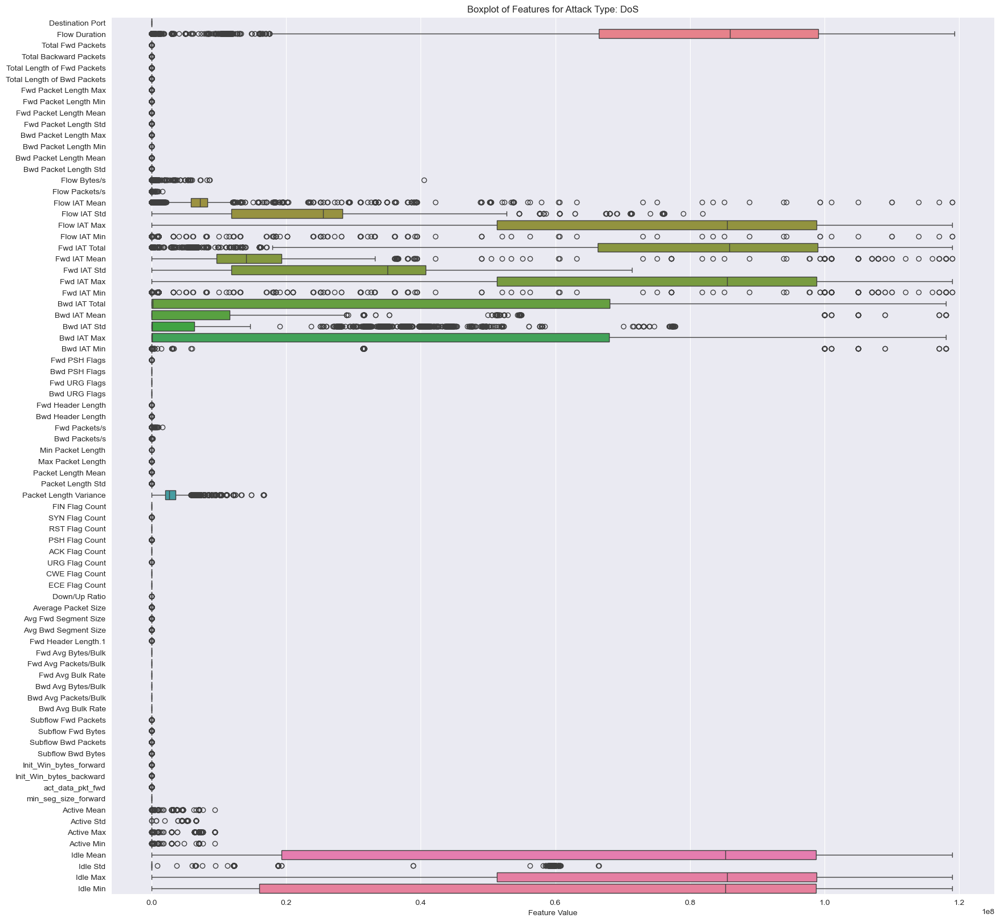

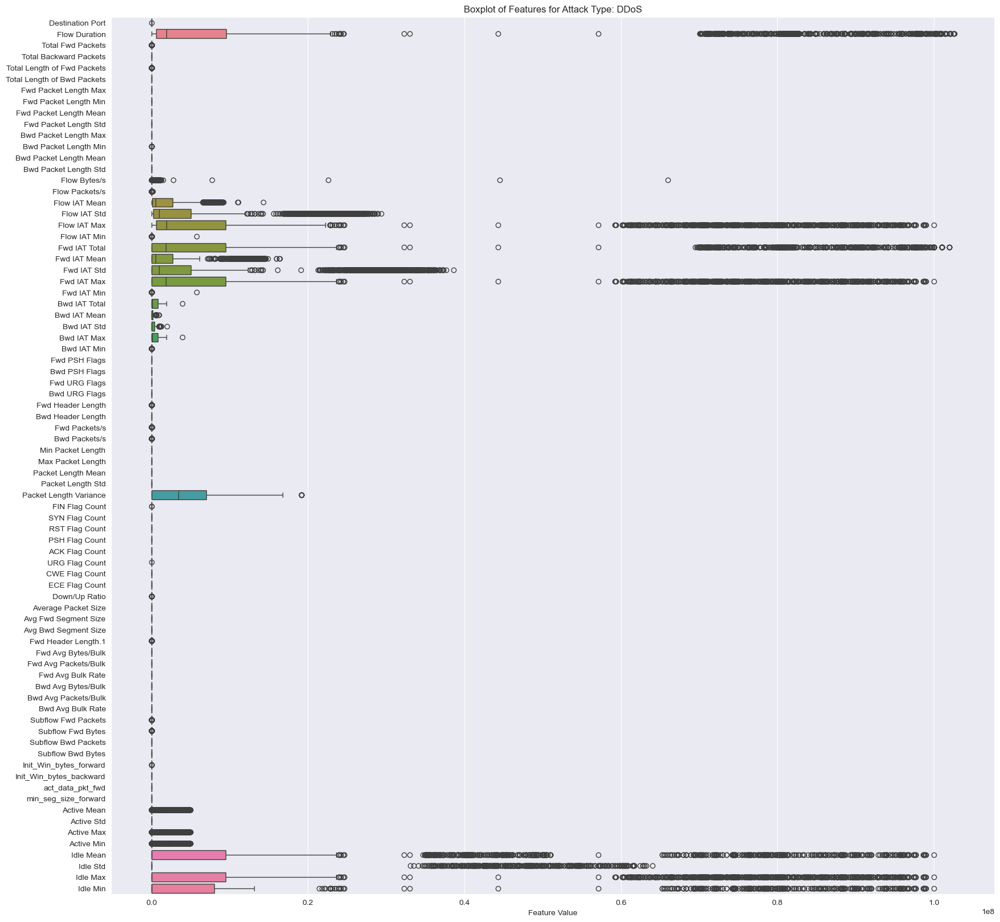

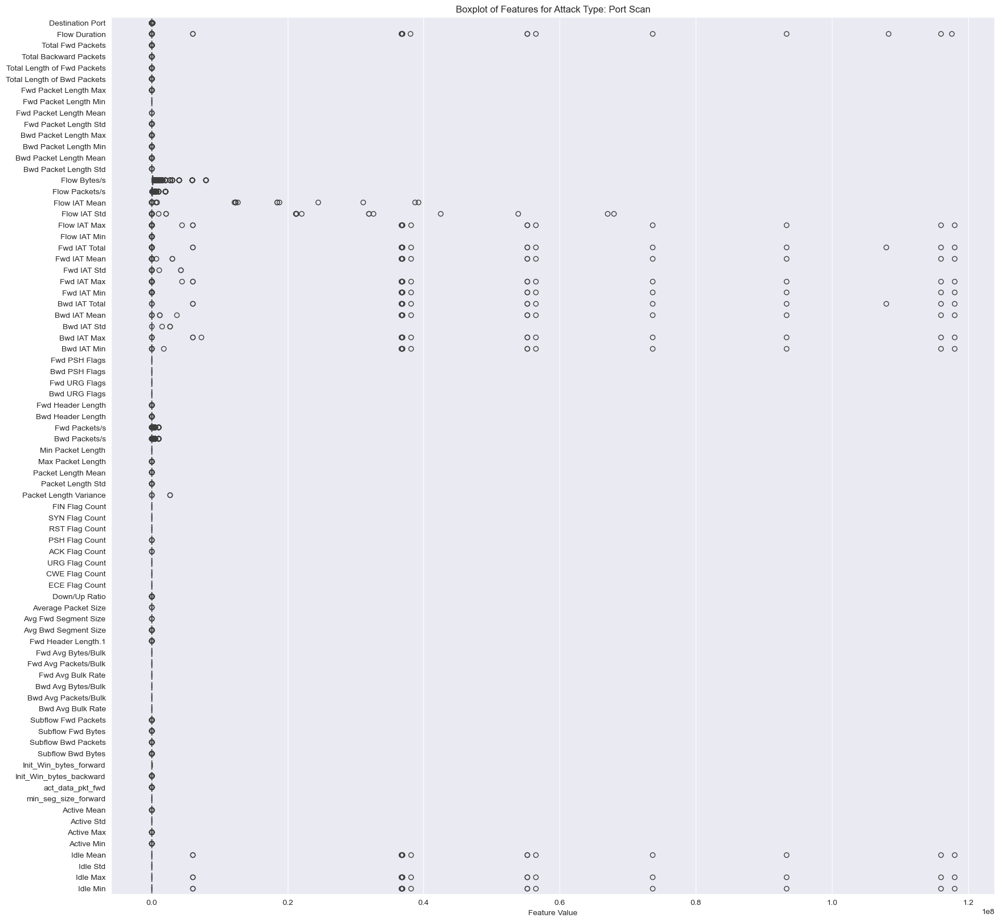

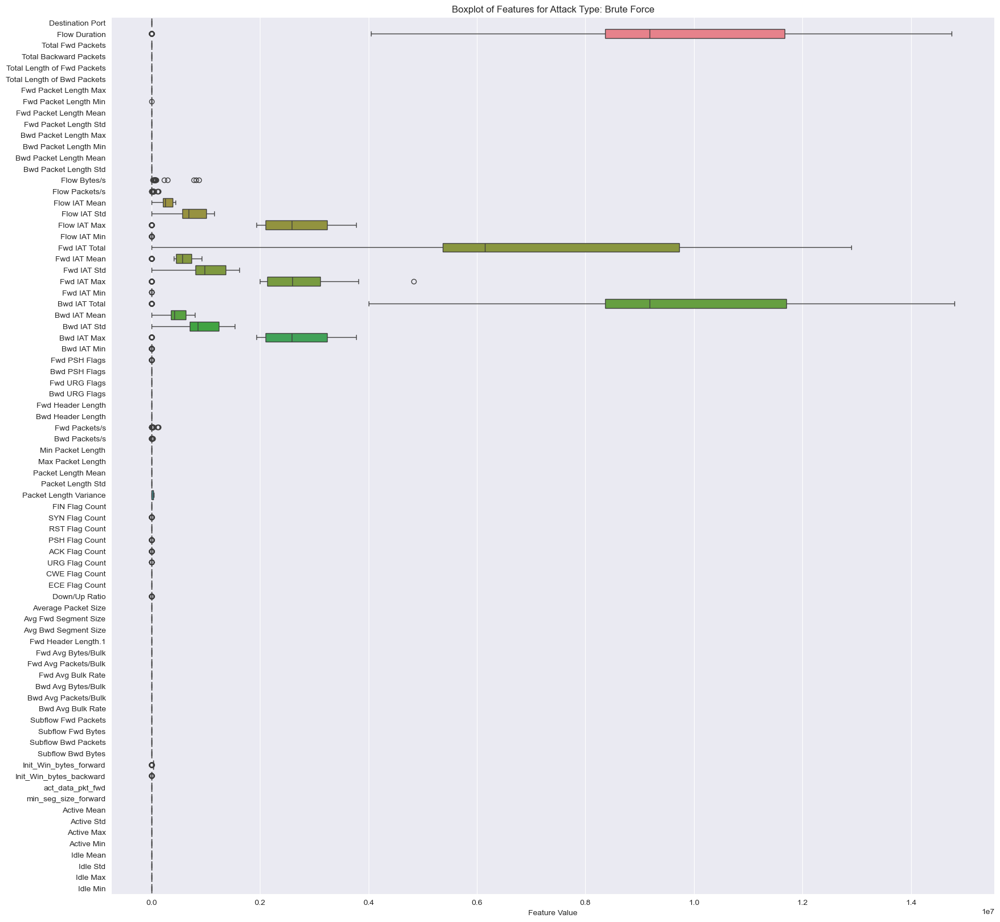

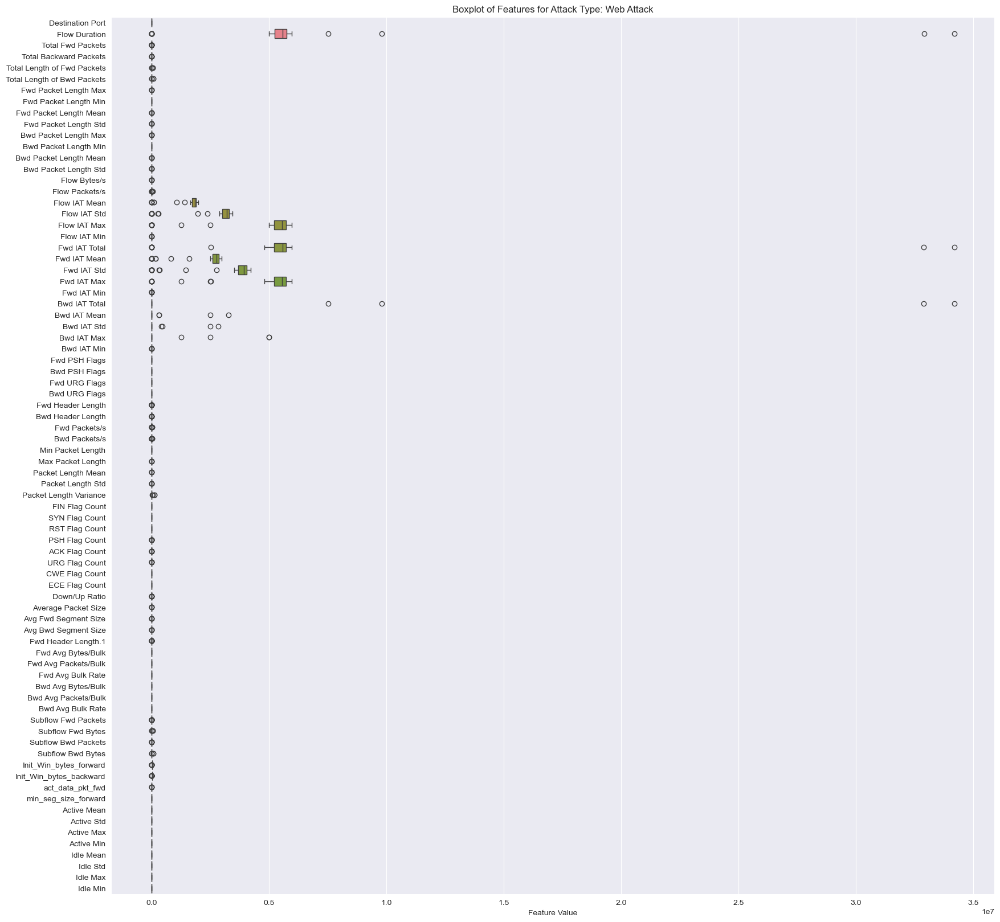

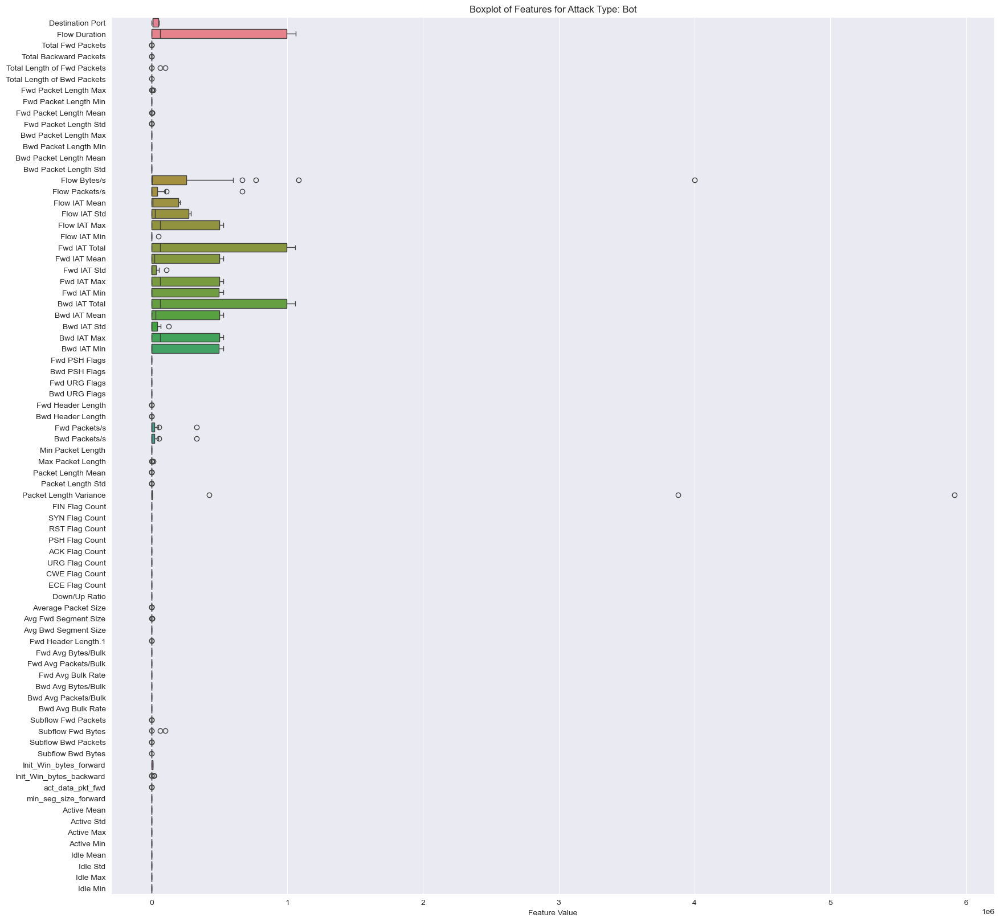

In [52]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [53]:
mldf.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,3.000000e+06,500000.000000,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,500000.000000,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,118,32,2217.0,0.00000,2217,2217,5024984.0,0.00000